We will use the Cohn-Kanade facial expression database (https://www.cs.cmu.edu/~face/database.htm). 

The dataset contains 210 instances, each one consisting of 25 measurements grouped by facial region: 

• Left eyebrow: H1, H2, H3, H4, L1 

• Right eyebrow: H5, H6, H7, H8, L2 

• Left eye: H9, H10, W1 

• Right eye: H11, H12, W2 

• Mouth: H13, H14, H15, W3, L3 

• Inter-region relationships: R1, R2, R3, R4 

Each record is labelled with an “Expression” field that can take one of seven emotion classes:  
NEUTRAL, DISGUST, SADNESS, FEAR, SURPRISE, ANGER, or JOY.

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
import seaborn as sns
import networkx as nx
import xlrd
import openpyxl

<center>
<span style="font-size:1.5em; font-weight:bold;">
Let's load the file with the dataset
</span>
</center>

In [54]:
df = pd.read_excel("C:/Users/Nikos/Downloads/cohn-kanade-rev_new.xls")

In [55]:
# can not show for legal reasons
#df.head()

In [56]:
print(df.isnull().any())

H1             False
H2             False
H3             False
H4             False
L1             False
H5             False
H6             False
H7             False
H8             False
L2             False
H9             False
H10            False
W1             False
H11            False
H12            False
W2             False
H13            False
H14            False
H15            False
W3             False
L3             False
R1             False
R2             False
R3             False
R4             False
Unnamed: 25    False
Unnamed: 26    False
Unnamed: 27    False
Expression     False
Unnamed: 29     True
Unnamed: 30     True
Unnamed: 31     True
Unnamed: 32     True
Unnamed: 33     True
Unnamed: 34     True
Unnamed: 35     True
dtype: bool


**We observe that the columns of interest do not miss any values.**

**We don't need the columns "Unnamed: #"**

That's because they don't contribute to our project's scope.

In [57]:
data = df.drop(['Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 
              'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35'], axis=1)

In [58]:
# can not show for legal reasons
#data.head()

**Also important is to know the size and shape of our data, as weel as the types that each column has.**

In [59]:
print(data.shape)

(210, 26)


In [60]:
print(data.dtypes)

H1             int64
H2             int64
H3             int64
H4             int64
L1             int64
H5             int64
H6             int64
H7             int64
H8             int64
L2             int64
H9             int64
H10            int64
W1             int64
H11            int64
H12            int64
W2             int64
H13            int64
H14            int64
H15            int64
W3             int64
L3             int64
R1             int64
R2             int64
R3             int64
R4             int64
Expression    object
dtype: object


**The dataset contains 25 numerical columns for the 210 measurements and one categorical for the target expression**

**Let's see if the dataset is balanced with respect to expressions**

Expression
NEUTRAL     30
DISGUST     30
SADNESS     30
FEAR        30
SURPRISE    30
ANGER       30
JOY         30
Name: count, dtype: int64


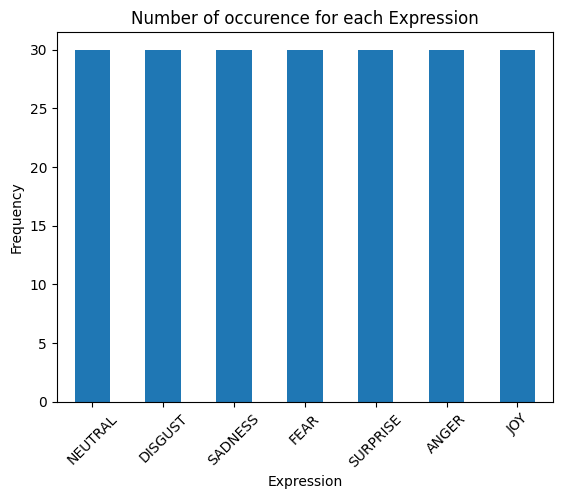

In [61]:
expression_counts = data['Expression'].value_counts()
print(expression_counts)

expression_counts.plot(kind = 'bar')
plt.xlabel('Expression'); plt.ylabel('Frequency'); plt.title('Number of occurence for each Expression'); plt.xticks(rotation = 45); plt.show()

**Let's now explore the numerical attributes.
We create a dataframe _data_numerical_ and print the statistics**

mean, std, min, max, Q1, Q2/median, Q3

In [62]:
data_numerical = data.drop("Expression", axis = 1)

with pd.option_context('display.max_columns', None):
    print(data_numerical.describe(include='all'))
    

               H1          H2          H3          H4          L1          H5  \
count  210.000000  210.000000  210.000000  210.000000  210.000000  210.000000   
mean    20.680952   16.604762   17.723810   22.038095   35.723810   20.347619   
std      2.527953    3.346208    2.632136    2.593418    5.642449    3.540351   
min      5.000000    5.000000    5.000000    5.000000    9.000000    5.000000   
25%     21.000000   15.000000   16.000000   23.000000   33.000000   19.000000   
50%     21.000000   17.000000   18.000000   23.000000   37.000000   21.000000   
75%     22.000000   19.000000   19.000000   23.000000   39.000000   23.000000   
max     23.000000   22.000000   22.000000   23.000000   46.000000   24.000000   

               H6          H7          H8          L2         H9         H10  \
count  210.000000  210.000000  210.000000  210.000000  210.00000  210.000000   
mean    17.938095   16.290476   19.300000   34.795238   17.90000   18.447619   
std      2.804811    3.781902 

**We save these statistics for later use**

In [47]:
data_stats = data_numerical.describe(include='all')

filename = f"DATA_stats.xlsx"
stats.to_excel(filename)
print(f"Saved: {filename}")

Saved: DATA_stats.xlsx


<center>
<span style="font-size:1.5em; font-weight:bold;">
It's easier to see what's happening using visualizations
</span>
</center>

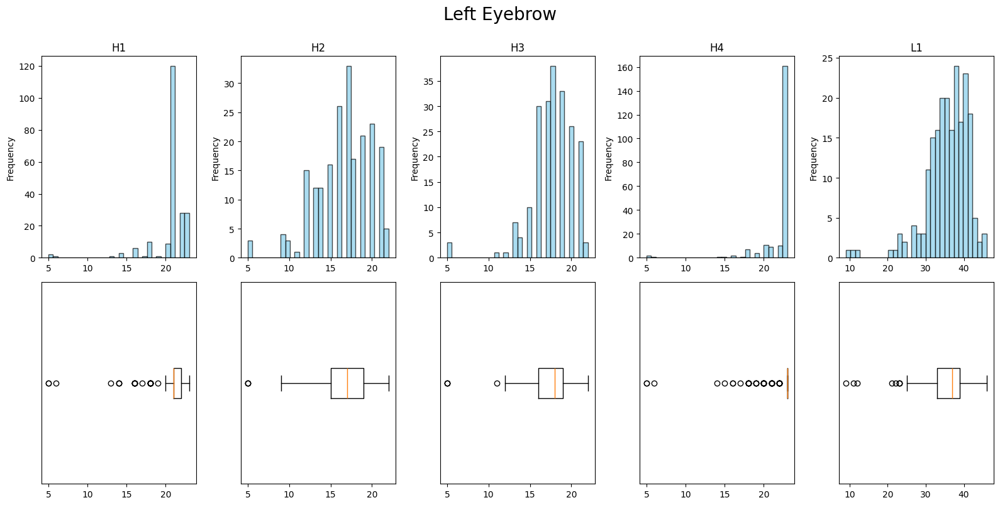

In [63]:
#Left Eyebrow
cols = ['H1', 'H2', 'H3', 'H4', 'L1']
fig, axes = plt.subplots(2, 5, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Left Eyebrow", fontsize=20, y=1)
plt.tight_layout()
plt.show()

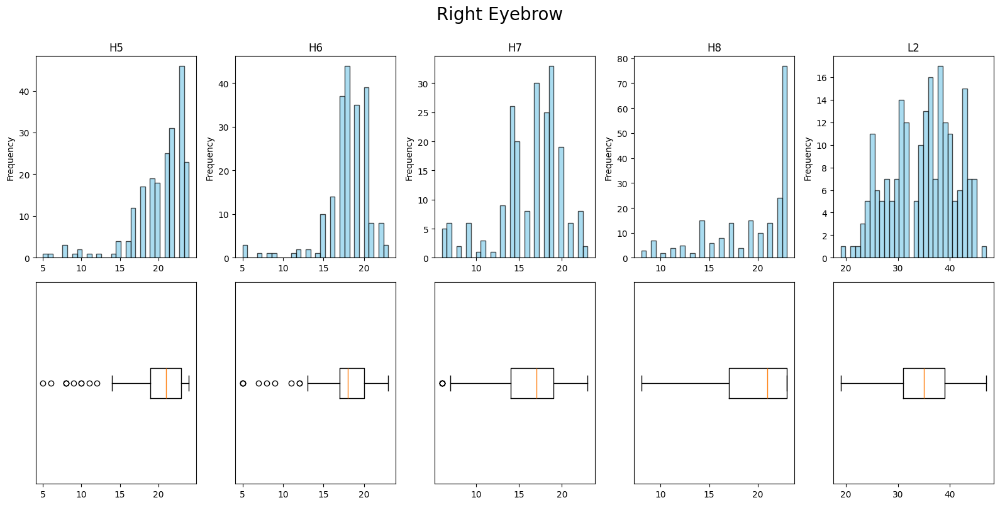

In [64]:
#Right Eyebrow
cols = ['H5', 'H6', 'H7', 'H8', 'L2']
fig, axes = plt.subplots(2, 5, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Right Eyebrow", fontsize=20, y=1)
plt.tight_layout()
plt.show()

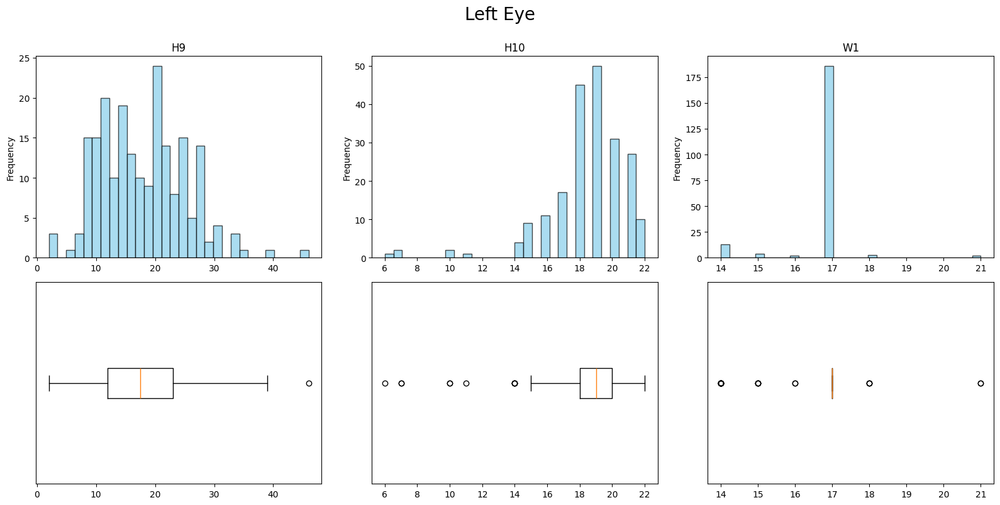

In [65]:
#Left eye
cols = ['H9', 'H10', 'W1']
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Left Eye", fontsize=20, y=1)
plt.tight_layout()
plt.show()

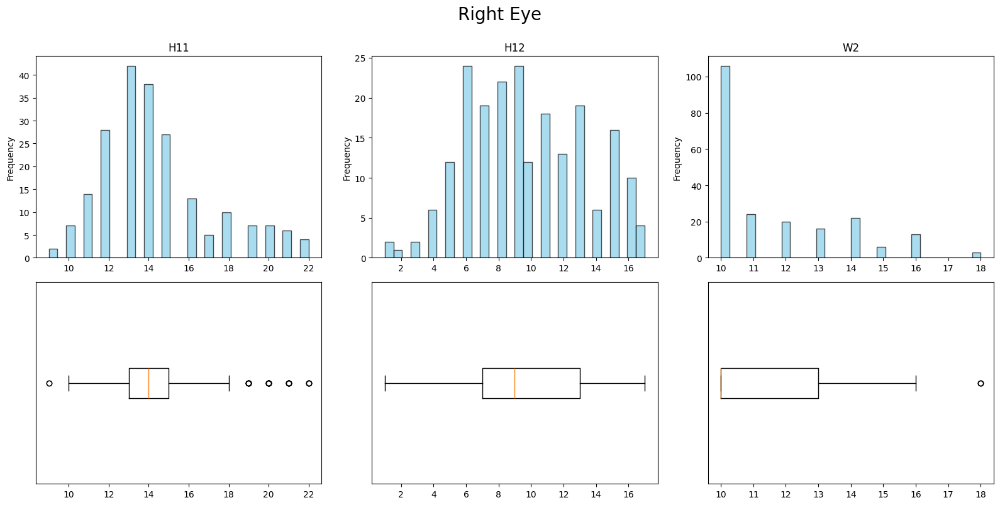

In [66]:
#Right eye
cols = ['H11', 'H12', 'W2']
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Right Eye", fontsize=20, y=1)
plt.tight_layout()
plt.show()

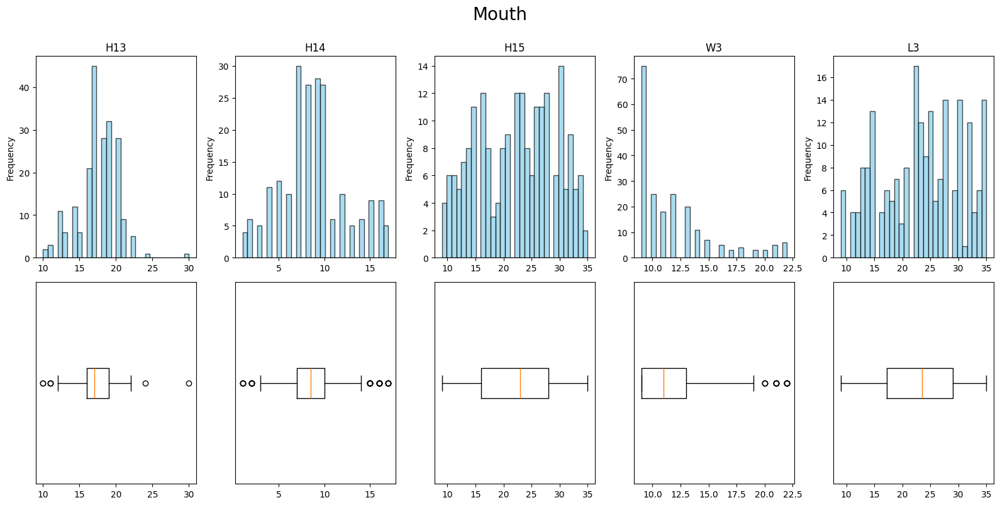

In [67]:
#Mouth
cols = ['H13', 'H14', 'H15', 'W3', 'L3']
fig, axes = plt.subplots(2, 5, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Mouth", fontsize=20, y=1)
plt.tight_layout()
plt.show()

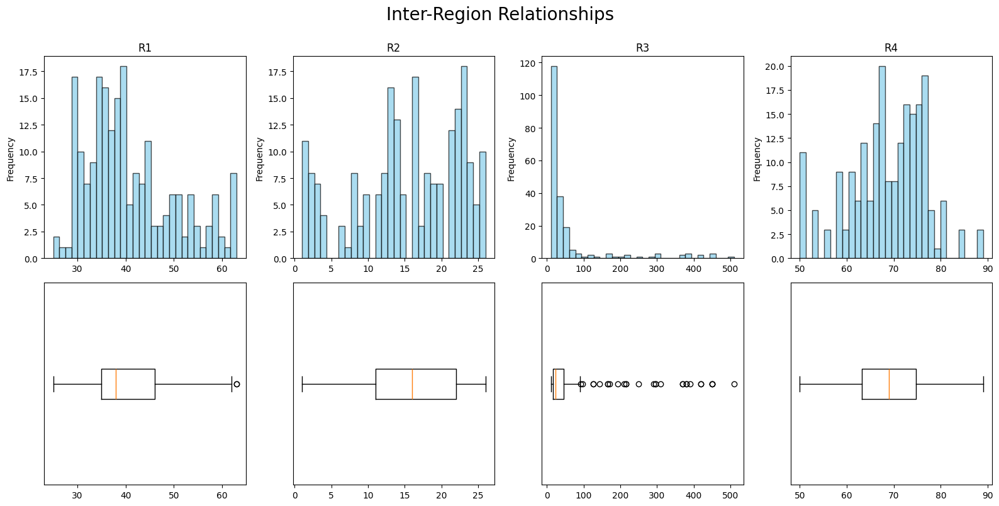

In [68]:
#Inter-Region Relationships
cols = ['R1', 'R2', 'R3', 'R4']
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

#histograms
for i, col in enumerate(cols):
    data_numerical[col].plot.hist(ax=axes[0, i], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Frequency')

#boxplots
for i, col in enumerate(cols):
    axes[1, i].boxplot(data_numerical[col], vert=False)
    axes[1, i].set_yticks([])

plt.suptitle("Inter-Region Relationships", fontsize=20, y=1)
plt.tight_layout()
plt.show()

<center>
<span style="font-size:1.5em; font-weight:bold;">
What's happening with the outliers?
</span>
</center>

**We observed many outliers in the boxplots above. Now let's see which rows have outliers**

In [69]:
cols = data_numerical.columns.tolist()
# Create a boolean DataFrame to flag outliers
outlier_flags = pd.DataFrame(False, index=data.index, columns=cols)

for col in cols:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    outlier_mask = (data[col] < Q1 - 1.5 * IQR) | (data[col] > Q3 + 1.5 * IQR)
    outlier_flags[col] = outlier_mask

# Find rows where ANY column is an outlier
rows_with_outlier = outlier_flags.any(axis=1)

# can not show for legal reasons
#with pd.option_context('display.max_columns', None, 'display.max_rows', None):
#    print(data[rows_with_outlier])

In [70]:
for idx in outlier_flags[rows_with_outlier].index:
    outlier_columns = outlier_flags.columns[outlier_flags.loc[idx]].tolist()
    print(f"Row {idx} has outliers in: {outlier_columns}")

Row 0 has outliers in: ['H14']
Row 1 has outliers in: ['H14']
Row 2 has outliers in: ['H14']
Row 3 has outliers in: ['H14']
Row 6 has outliers in: ['H14']
Row 7 has outliers in: ['H4', 'W3', 'R3']
Row 8 has outliers in: ['H1', 'H3', 'H4', 'H5', 'H6', 'H7', 'H10', 'W3']
Row 9 has outliers in: ['H4']
Row 10 has outliers in: ['H1', 'H4', 'H10', 'W1', 'R3']
Row 11 has outliers in: ['H4', 'W3', 'R3']
Row 13 has outliers in: ['H4', 'W3', 'R3']
Row 15 has outliers in: ['H7']
Row 16 has outliers in: ['H4', 'H5', 'W1', 'H13']
Row 18 has outliers in: ['H1']
Row 21 has outliers in: ['R3']
Row 22 has outliers in: ['H1', 'H4', 'L1', 'W1', 'H14']
Row 25 has outliers in: ['R3']
Row 26 has outliers in: ['W1']
Row 27 has outliers in: ['R3']
Row 28 has outliers in: ['R3']
Row 29 has outliers in: ['H4', 'W1', 'H11']
Row 31 has outliers in: ['W1', 'R3']
Row 32 has outliers in: ['L1', 'W1']
Row 33 has outliers in: ['R3']
Row 34 has outliers in: ['R3']
Row 36 has outliers in: ['H1', 'H2', 'H3', 'H4', 'L1', 

In [71]:
columns_with_outliers = outlier_flags.any(axis=0)
columns_with_outliers = columns_with_outliers[columns_with_outliers].index.tolist()
print(columns_with_outliers)

['H1', 'H2', 'H3', 'H4', 'L1', 'H5', 'H6', 'H7', 'H9', 'H10', 'W1', 'H11', 'W2', 'H13', 'H14', 'W3', 'R1', 'R3']


**Almost every row has an outlier ?**

We observe a relatively important frequency of outliers for every expression, and while these outliers cannot be mapped to a single expression, there is a noticeably higher concentration in the SURPRISE category.

Given the prevalence of outliers across the dataset and the size of the dataset, we have decided to retain them for now. Excluding them could compromise the integrity and diversity of our data. Furthermore, since these measurements are taken from human faces, the presence of outliers may simply indicate that some individuals exhibit stronger or more pronounced facial expressivity than others when performing certain expressions.

For these reasons, we believe it is more appropriate to keep the outliers at this stage of analysis.

<center>
<span style="font-size:1.5em; font-weight:bold;">
Correlations
</span>
</center>

**First let's see the correlation matrix**

Given the context of the data (i.e., many outliers) we will use Spearman correlation coefficient, instead of Pearson, becase is more robust to outliers.

In [72]:
corr_matrix_spearman = data_numerical.corr(method = 'spearman')
#with pd.option_context('display.max_columns', None, 'display.max_rows', None):
#    print(corr_matrix_spearman)

**We plot the correlation heatmap to visualize the relationships better**

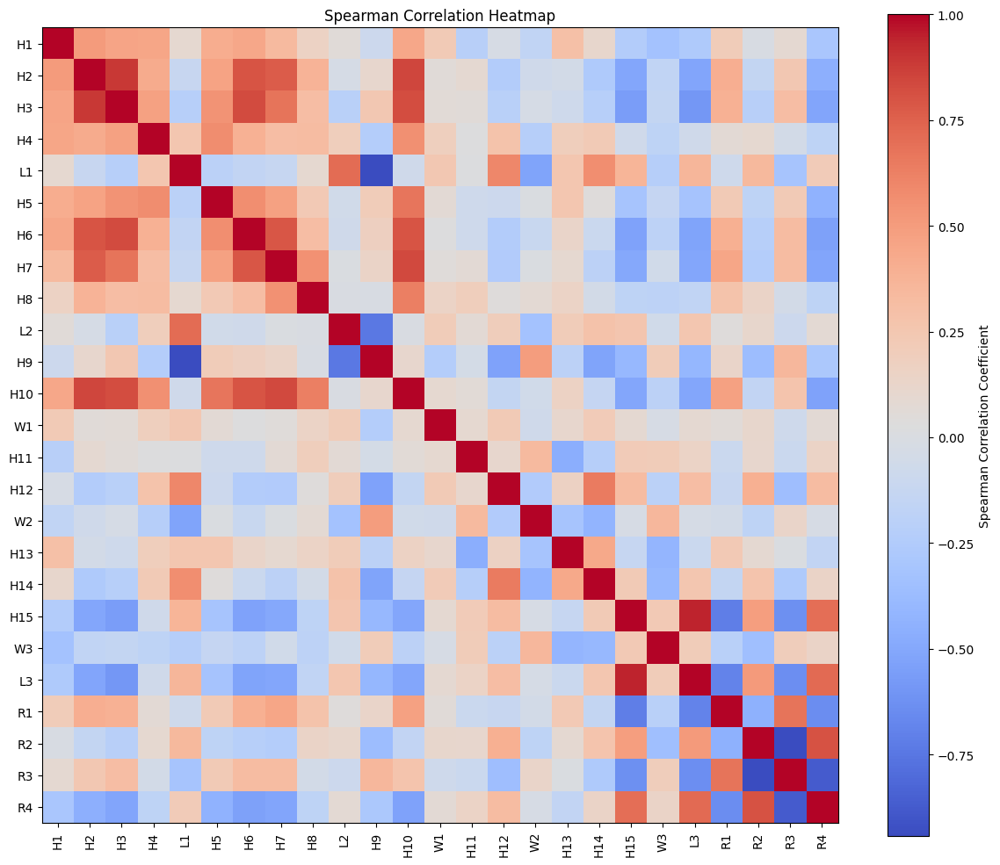

In [73]:
plt.figure(figsize=(12, 10))
plt.imshow(corr_matrix_spearman, cmap='coolwarm')
plt.colorbar(label='Spearman Correlation Coefficient')
plt.xticks(range(len(corr_matrix_spearman.columns)), corr_matrix_spearman.columns, rotation=90)
plt.yticks(range(len(corr_matrix_spearman.columns)), corr_matrix_spearman.columns)
plt.title('Spearman Correlation Heatmap')
plt.tight_layout()
plt.show()

**Also helpful and informative is the correlation pairplot**

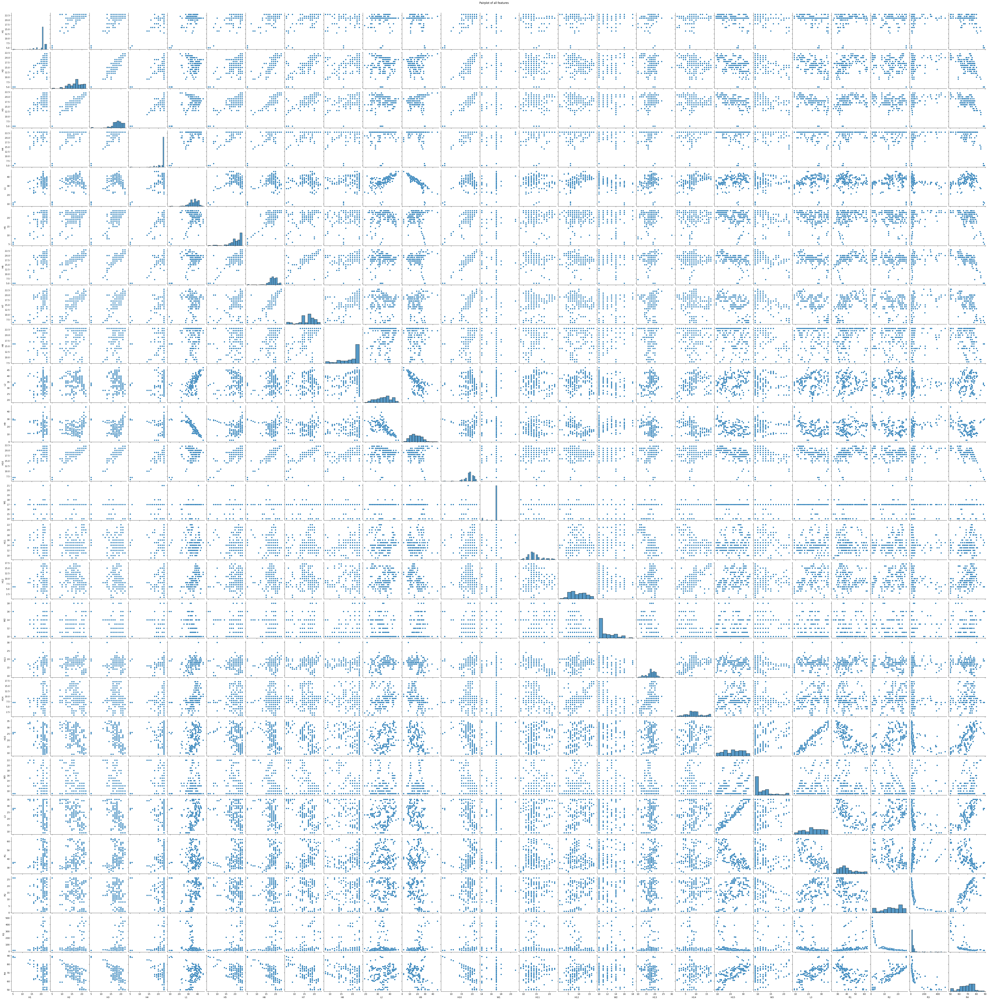

In [28]:
sns.pairplot(data_numerical)
plt.suptitle('Pairplot of all features', y = 1)
plt.show()

**Here we plot the pairplot with each expression ploted with different color**

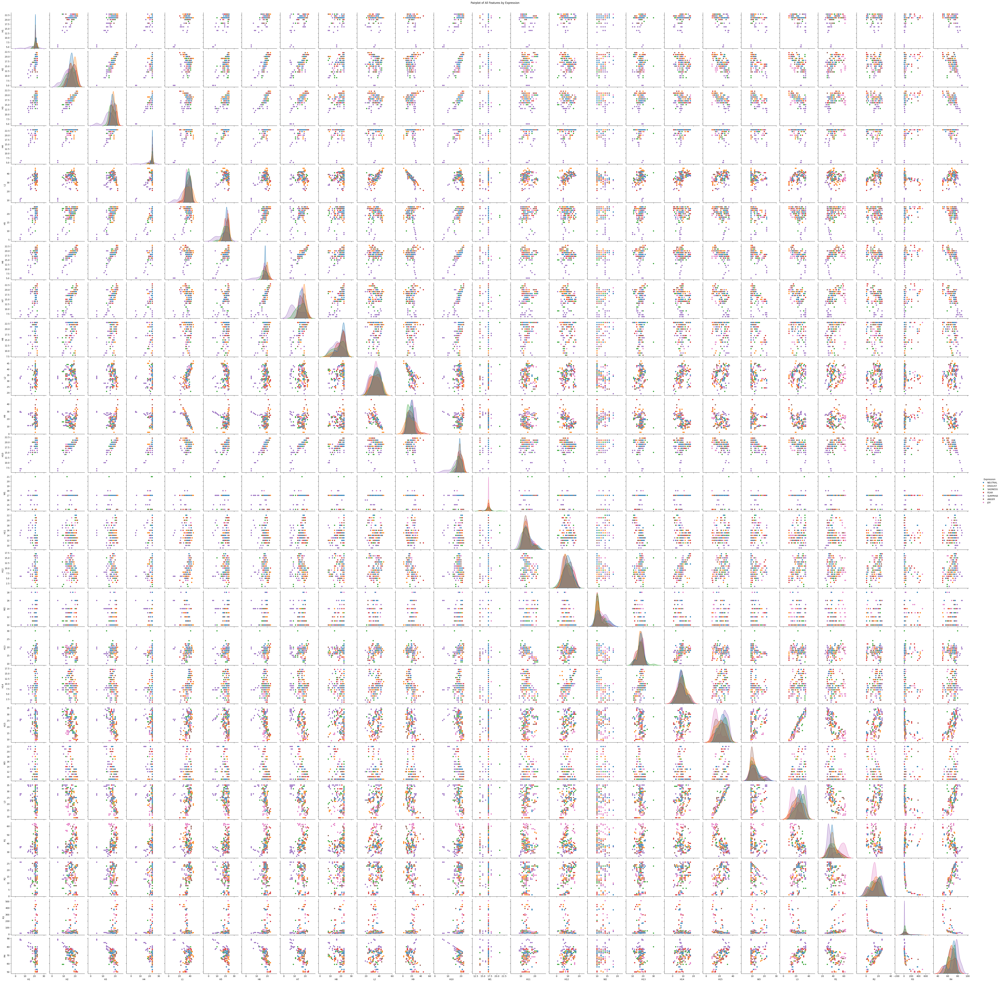

In [29]:
sns.pairplot(data, hue='Expression')
plt.suptitle('Pairplot of All Features by Expression', y = 1)
plt.show()


**We also plot the Clustered Heatmap with complete linkage**

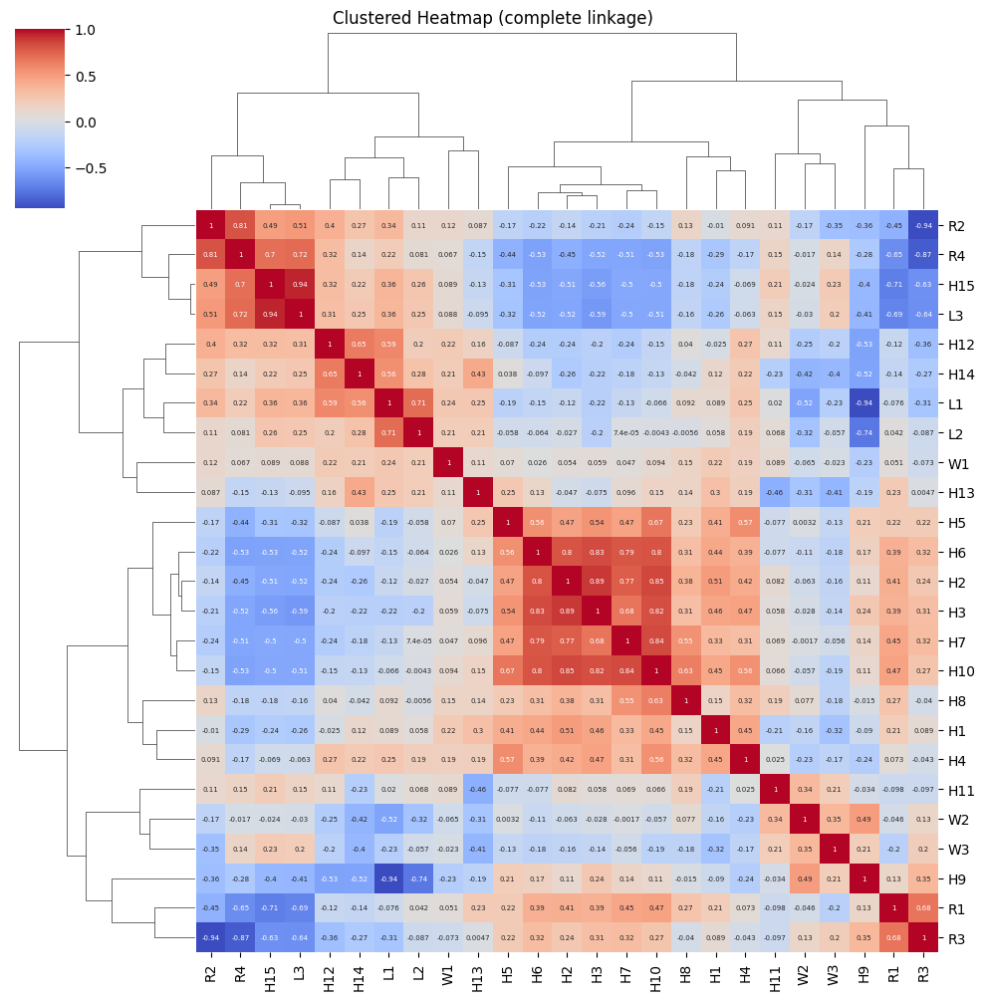

In [78]:
import seaborn as sns
sns.clustermap(data_numerical.corr(method = 'spearman'), cmap='coolwarm', annot=True, annot_kws={'size': 5}, method = 'complete')
plt.suptitle('Clustered Heatmap (complete linkage)', y = 1)
plt.show()

**Let's see which pairs are strongly correlated**

In [75]:
# upper triangle of the correlation matrix
# we will take the absolute value to see the 'srtength'
corr_matrix = corr_matrix_spearman.abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# stack the triangle and sort in descending order
sorted_corrs = upper_tri.stack().sort_values(ascending=False)

# print the pairs of correlations
for (col1, col2), value in sorted_corrs.items():
    if corr_matrix_spearman.loc[col1, col2] >=0.50:
        print(f"{col1} - {col2}: {corr_matrix_spearman.loc[col1, col2]:.3f}")

H15 - L3: 0.943
H2 - H3: 0.890
H2 - H10: 0.847
H7 - H10: 0.839
H3 - H6: 0.826
H3 - H10: 0.820
R2 - R4: 0.806
H2 - H6: 0.802
H6 - H10: 0.796
H6 - H7: 0.794
H2 - H7: 0.768
L3 - R4: 0.717
L1 - L2: 0.710
H15 - R4: 0.697
R1 - R3: 0.678
H3 - H7: 0.676
H5 - H10: 0.670
H12 - H14: 0.650
H8 - H10: 0.630
L1 - H12: 0.595
H4 - H5: 0.573
H5 - H6: 0.565
L1 - H14: 0.563
H4 - H10: 0.556
H7 - H8: 0.547
H3 - H5: 0.540
L3 - R2: 0.509
H1 - H2: 0.506


We can see some strong correlations among facial features.

53 pairs have |correlation| >= 0.50 <br>
28 pairs have |correlation| >= 0.60 <br>
18 pairs have |correlation| >= 0.70 <br>
11 pairs have |correlation| >= 0.80 <br>
3 &nbsp; pairs have |correlation| >= 0.90 <br>

**For each expression we calculate and save the statistics for later use**

In [76]:
for expr in data['Expression'].unique():
 
    expr_df = data_numerical[data['Expression'] == expr]

    stats = expr_df.describe(include='all')

    filename = f"{expr}_stats.xlsx"
    stats.to_excel(filename)
    print(f"Saved: {filename}")


Saved: NEUTRAL_stats.xlsx
Saved: DISGUST_stats.xlsx
Saved: SADNESS_stats.xlsx
Saved: FEAR_stats.xlsx
Saved: SURPRISE_stats.xlsx
Saved: ANGER_stats.xlsx
Saved: JOY_stats.xlsx


<center>
<span style="font-size:1.1em; font-weight:bold;">
The different data-frames created
</span>
</center>


| Name of data-frame | Description |
| :---: | --- |
| **df** | the _.xls_ file loaded |
| **data** | the dataset with the selected attributes |
| **data_numerical** | numerical attributes of _data_ |

<br>
<center>
<span style="font-size:1.1em; font-weight:bold;">
The .xlsx files created
</span>
</center>

| Name of file | Description |
| :---: | --- |
| **DATA_stats** | Descriptive statistics for all of the expressions |
| **NEUTRAL_stats** | Descriptive statistics for Neutral |
| **DISGUST_stats** | Descriptive statistics for Disgust |
| **SADNESS_stats** | Descriptive statistics for Sadness |
| **FEAR_stats** | Descriptive statistics for Fear |
| **SURPRISE_stats** | Descriptive statistics for Surprise |
| **ANGER_stats** | Descriptive statistics for Anger |
| **JOY_stats** | Descriptive statistics for Joy |

<center>
<span style="font-size:1.5em; font-weight:bold;">
Conclusive Summary
</span>
</center>

In this exploratory analysis we examined the Cohn-Kanade facial expression database, containing 210 samples with 25 facial region measurements and a categorical expression label.

Our exploratory analysis revealed that all facial expression classes are balanced, and there are no missing values. Most facial feature measurements have tight distributions, though some attributes display significant outliers—possibly reflecting strong individual expressivity rather than errors. <br>
Visualizations and summary statistics provided insight into feature ranges and potential correlations. At this stage, we have chosen to retain outliers to preserve data diversity. 

Correlation analysis revealed several strong relationships between facial features, especially among features measuring similar facial regions. We used Spearman correlation to account for outliers and potential non-linear associations. These findings will guide future feature selection and model development.

Because we need to respect the licensing and distrubition rules of the original data, we choose to continue with synthetic mimicing the behaviour of the original and not present in any way parts of the original dataset. <br>
For academic, educational, and non-commercial research purposes, we will further continue to feature engineering and machine learning modeling with the synthetic data we will create.

